In [1]:
import os
fname = 'data/CS/Set11/' 
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn.functional as F
import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from utils.denoising_utils import *

dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 10
sigma_ = sigma/255.

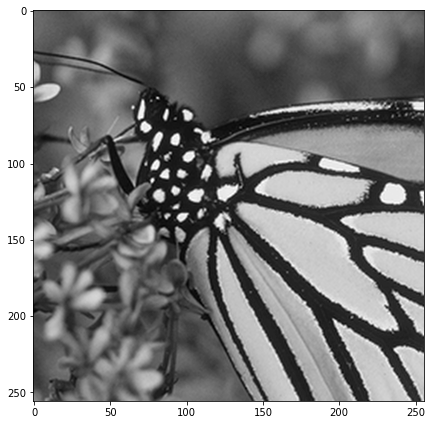

(1, 256, 256)


In [3]:
img_pil = crop_image(get_image(fname+'Monarch.tif', imsize)[0], d=32)
img_np=pil_to_np(img_pil)
img_np = img_np
img_var=torch.tensor(img_np).type(dtype)
img_var=img_var.unsqueeze(0)
if PLOT:
    plot_image_grid([img_np], 4, 6);
print(img_np.shape)

In [4]:
from scipy.linalg import sqrtm
n = 33*33
m = int(n/4)
A = torch.empty(n,m).normal_(0, 1)
B=torch.mm(torch.transpose(A,1,0),A)
B=torch.inverse(B)
B=sqrtm(B)
B=torch.Tensor(B)
A=torch.mm(A,B)
A=A.type(dtype)

In [5]:
block_size=33
zz,c,w,h = img_var.shape
pad_right = block_size - w%block_size
pad_bottom = block_size - h%block_size
padd = (0,pad_bottom,0,pad_right)
def forwardm(Img,Phi_input,pad,block_size):
    Img_pad = F.pad(Img, pad, mode='constant', value=0)
    p,c,w,h = Img_pad.size()
    Img_col = torch.reshape(Img_pad,(p,c,-1,block_size,h))
    n = Img_col.size()[2]
    Img_col = Img_col.reshape((p,c,n,block_size,-1,block_size))
    Img_col = Img_col.permute(0,1,2,4,3,5)
    Img_col = Img_col.reshape(p,c,-1,block_size*block_size)

    Img_cs = torch.matmul(Img_col, Phi_input)
    return Img_cs
measurement=forwardm(img_var,A,padd,33)
ssize=measurement.size()
measure_noise = torch.cuda.FloatTensor(ssize)
torch.randn(ssize, out=measure_noise)
measurement=measurement+sigma_*measure_noise

In [6]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'
reg_noise_std =1./50. # set to 1./20. for sigma=50
LR = 0.001
show_every = 100
num_iter = 5000
input_depth = 32
figsize = 4 

net = get_net(input_depth,'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              n_channels=1,
              upsample_mode='bilinear').type(dtype)  
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameter
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

Number of params: 2217573


In [7]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
out=None
i = 0
psnr_total=[]
psnr_avg_total=[]
loss_total=[]
burn_in=1000

loss_data=1
def closure():
    
    global i, out,out_avg, net_input, loss_data
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if i>burn_in:
        if out_avg is None:
            out_avg=out.detach()
        else:
            out_avg = out_avg * (i-burn_in-1)/(i-burn_in) + out.detach() * 1/(i-burn_in)
    total_loss = mse(forwardm(out,A,padd,33),measurement)
    loss_data=total_loss.item()
    total_loss.backward()
    psrn_gt = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_avg=psrn_gt
    if i>burn_in:
        psrn_gt_avg = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
    print ('Iteration %05d    Loss %f    PSRN_gt: %f  PSNR_gt_avg: %f' % (i, total_loss.item(), psrn_gt, psrn_gt_avg), '\r', end='')

    if  PLOT and i % show_every == 0 and i>burn_in:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(torch_to_np(out), 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
    
            
    i += 1
    psnr_total.append(psrn_gt)
    psnr_avg_total.append(psrn_gt_avg)
    return total_loss




In [8]:
def add_noise(model,nlevel):
    for n in [x for x in model.parameters() if len(x.size()) == 4]:
        noise = torch.randn(n.size())*1*LR*nlevel
        noise = noise.type(dtype)
        n.data = n.data + noise

/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


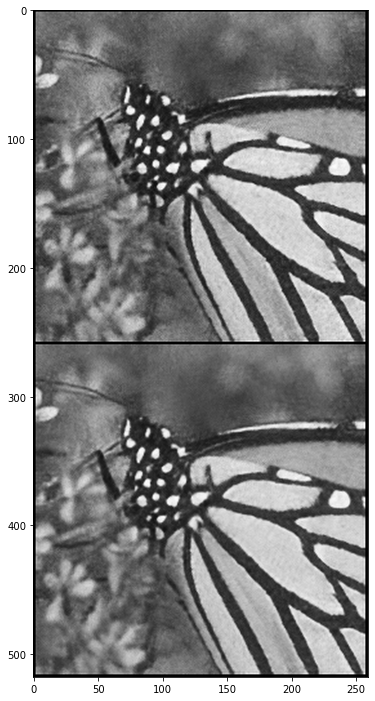

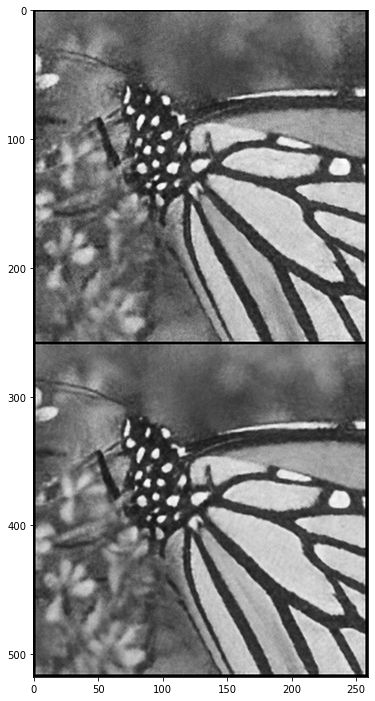

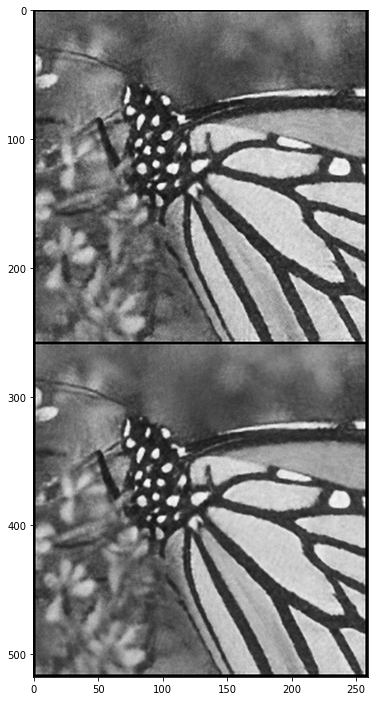

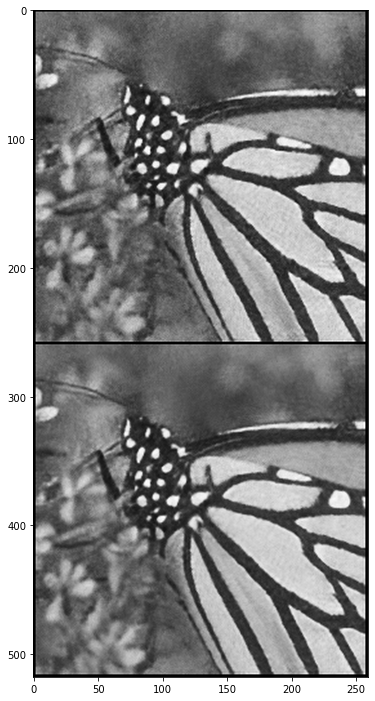

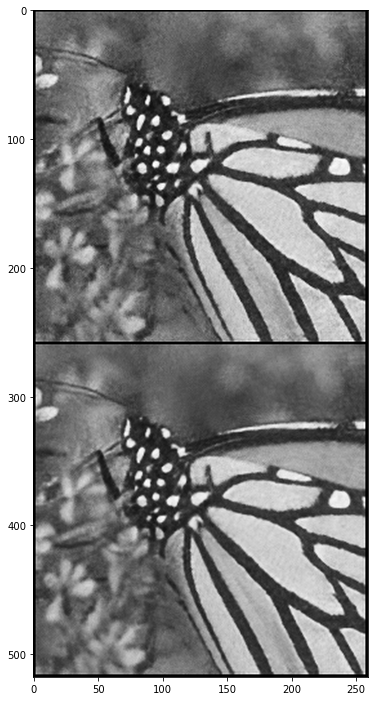

...

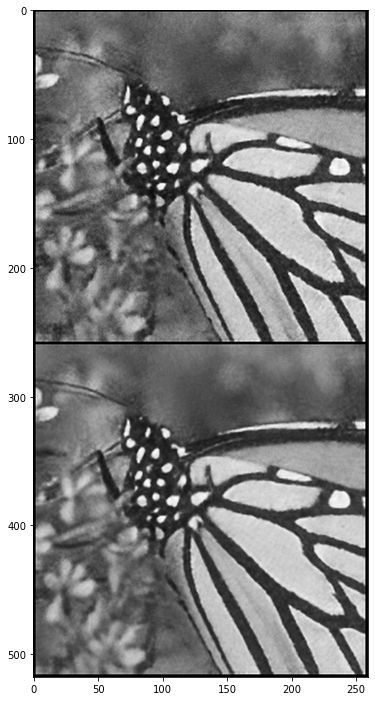

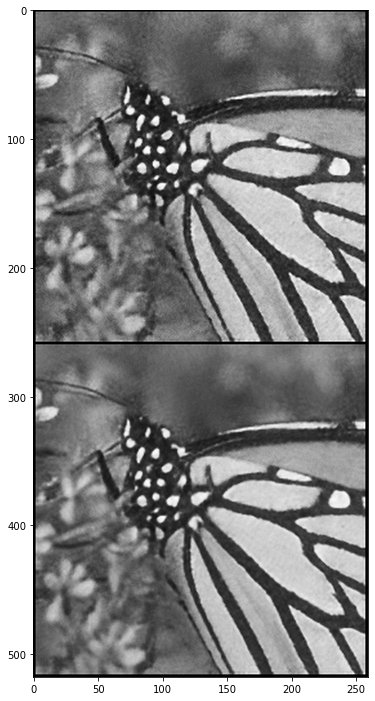

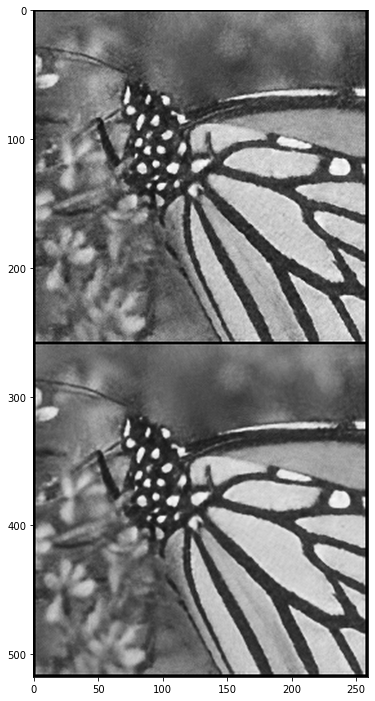

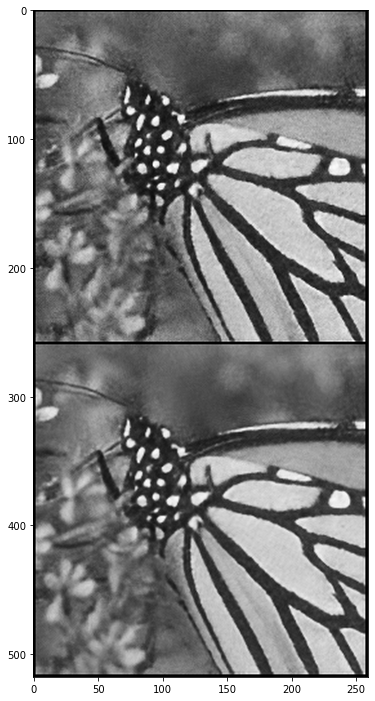

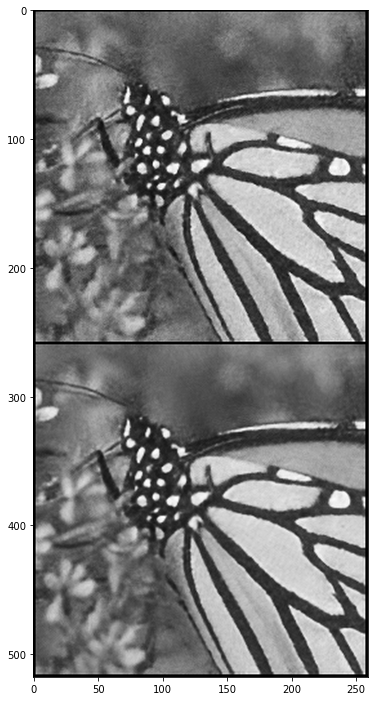

In [9]:
measure_error=1*(sigma_)**2
import math
optimizer = torch.optim.Adam([{'params':net.parameters()}], lr=LR,weight_decay=5e-8)
for _ in range(num_iter):
    nlevel=math.exp(30*((measure_error/loss_data)-1))
    optimizer.zero_grad()
    closure()
    optimizer.step()
    add_noise(net,nlevel)
#You can also replace Adam to Adagrad (and increase the stepszie to 0.003). Adam can give slightly better performance (around 0.5dB) than Adagrad. 

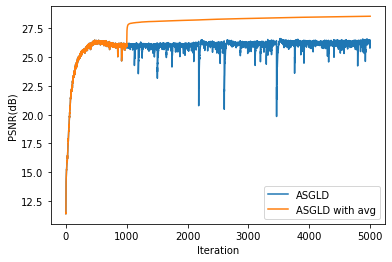

In [10]:
import matplotlib.pyplot as plt
x=range(5000)
cc1=psnr_total
cc2=psnr_avg_total
plt.xlabel("Iteration")
plt.ylabel("PSNR(dB)")
plt.plot(x, cc1,label='ASGLD' ) 
plt.plot(x, cc2,label='ASGLD with avg' ) 
plt.legend()
plt.show() 